In [1]:
import pandas as pd
from bertopic import BERTopic
from sentence_transformers import SentenceTransformer
from sklearn.feature_extraction.text import CountVectorizer
from umap import UMAP

pd.set_option('display.max_colwidth', 50)

C:\miniconda3\envs\climatenlp\lib\site-packages\umap\distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\miniconda3\envs\climatenlp\lib\site-packages\umap\distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
C:\miniconda3\envs\climatenlp\lib\site-packages\umap\distances.py:1086: NumbaDeprecationWarning: The '

In [3]:
df = pd.read_csv('../data/climate_news.tar.bz2')
df['published_date'] = pd.to_datetime(df['published_date'])

In [4]:
# Data cleaning 
# Removing duplicates, irrelevant articles
# and rows without summaries

df.drop_duplicates(subset = ['summary'], inplace = True)
df = df.query(" _score > 5")

mask = df['summary'].notna()
df = df[mask]

df.shape

(8917, 19)

In [5]:
news_list = df['summary'].to_list()
timestamps = df['published_date'].dt.strftime('%Y-%m-%d').to_list()

In [29]:
vectorizer_model = CountVectorizer(stop_words = 'english')

sentence_model = SentenceTransformer("all-MiniLM-L6-v2")
embeddings = sentence_model.encode(news_list, show_progress_bar=True)

topic_model = BERTopic(nr_topics = 20, vectorizer_model = vectorizer_model, verbose = True).fit(news_list, embeddings)

Batches: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████| 279/279 [00:19<00:00, 14.14it/s]
2023-05-03 20:26:37,181 - BERTopic - Reduced dimensionality
2023-05-03 20:26:37,407 - BERTopic - Clustered reduced embeddings
2023-05-03 20:26:52,044 - BERTopic - Reduced number of topics from 185 to 20


In [30]:
topic_model.get_topic_info()

,Topic,Count,Name
0,-1,3136,-1_said_climate_new_people
1,0,3936,0_said_climate_new_energy
2,1,720,1_water_heat_said_weather
3,2,527,2_food_said_species_meat
4,3,146,3_amazon_petro_deforestation_bolsonaro
5,4,65,4_ice_arctic_bears_polar
6,5,65,5_prince_commonwealth_saudi_charles
7,6,59,6_ski_snow_olympics_winter
8,7,42,7_wsj_preston_illustration_sticking
9,8,39,8_plastic_plastics_recycling_waste


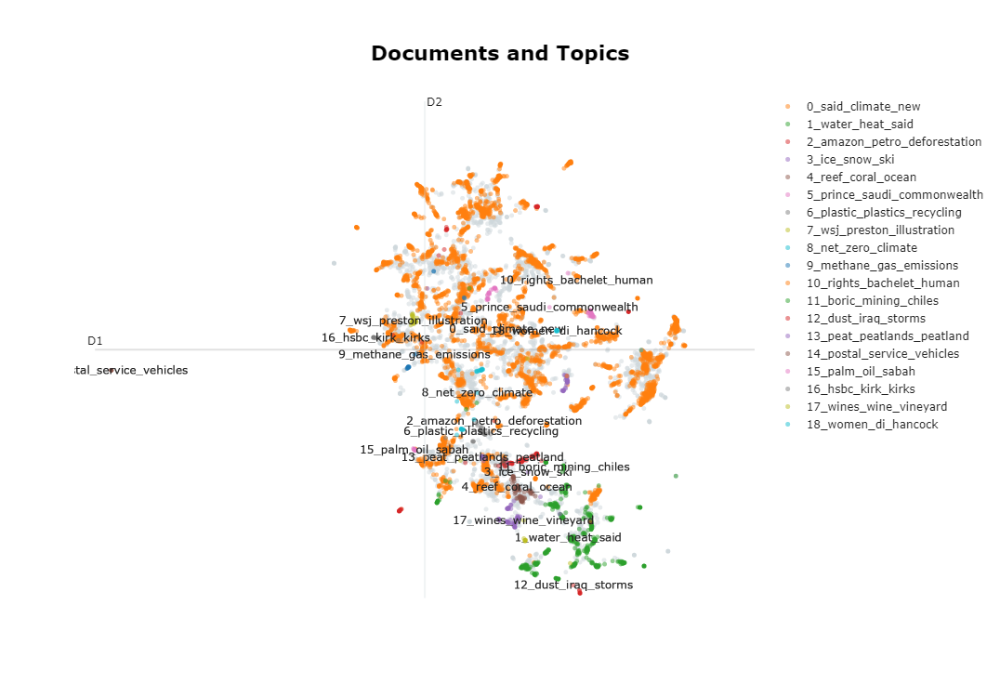

In [12]:
news_wrap = (df['summary'].str[:800].str.wrap(50)
             .apply(lambda x: x.replace('\n', '<br>')).to_list())

umap = UMAP(n_neighbors=10, n_components=2, min_dist=0.0,
            metric='cosine', random_state = 1)

reduced_embeddings = umap.fit_transform(embeddings)

fig = topic_model.visualize_documents(news_wrap, topics = list(range(50)), 
                                      reduced_embeddings = reduced_embeddings, sample = 1)
fig.show()

In [ ]:
fig.write_html('climate_news.html', include_plotlyjs = 'cdn')